## Aim
We are given the frequency representation of an acoustic signal and we want to reconstruct the original signal.
In this notebook, we will be considering three frequency distributions, namely STFT, Reassigned Spectrogram and Kymatio's
1D Scattering transform. 

## Approach
Some of the transforms don't have an explicit inverse. So, we will be using neural networks to learn an inverse transform.

A brief overview of my approach for inverting different representations is given below. The visual and aural results along with some further observations cna be found in the following cells.

### STFT
We compute STFT with hop_length of 512. So, if the signal length is N, we get n\_frames=(N//512+1)
for an audio clip (assuming padding is enabled i.e. center=True in librosa). 
Since we are using n_fft=2048, the dimension of STFT is (1+n\_fft/2) x n\_frames. Specifically, the time representation for
ith STFT is the indices from hop_length\*i to(hop_length\*(i+1).

Since STFT output is complex number, we split it to form 2 channels containing real and imaginary part. The final neural network **input** is of the form of B x (1+n\_fft/2) x 2 and the **output** is of the form B x hop\_length where B is the batch size.
In the inverse STFT algorithm. the frequency representation is first passed through a windowing function. This motivated me to add a learnable windowing function in the neural network. So, the input (i.e. STFT) is first fed into the learnable windowing function and then passed to a single fully connected layer with tanh non-linearity. This simple network was able to get good results even on the unseen test set. The network was trained for 100 epochs with Adam optimizer. ReduceLROnPlateau was used as learning rate scheduler.

### Reassigned STFT
We use librosa's [reassigned_spectrogram](https://librosa.org/doc/latest/generated/librosa.reassigned_spectrogram.html) to obtain the frequency representation. In my initial experiments, I found that a straightforward approach like using RA freq. representation as input to network and trying to predict time representation directly doesn't yield good results. The network output doesn't sound good even for the training set.

I modified the network to output STFT representation & the time representation. The STFT is an auxillary output that is used **only** during the training of network. My reasoning was that if we can somehow get the network to predict STFT correctly, then our life becomes simpler since we have already developed a learnable mapping for STFT.

I found that using this approach, the network was able to give good predictions for the training set. The output of librosa's reassigned_spectrogram is concatentated into a feature vector which is then normalized and preprocessed and fed into the neural network. The input to network is of the form B x feat\_dim and network has two outputs, STFT output of the form B x (1+n\_fft/2) x 2 and time representation of the form B x hop\_length.

Loss = MSE(pred_stft, actual_stft) + alpha \* MSE(pred_waveform, actual_waveform). 
I set alpha=100


The input is fed into four fully connected layers with LeakyRelu non-linearity to predict STFT. A Residual connection after first two layers was found to improve the result slightly. Similar to our STFT experiment, the predicted STFT is passed through a learnt window and then into a single fully connected layer with tanh non-linearity to obtain the acoustic signal. Please refer to **RAModel** in train_utils.py for exact architecture details.
The network was trained using AdamW optimizer for 50 epochs and ReduceLROnPlateau was used as learning rate scheduler.


### Kymatio's 1D scattering transform
Kymatio's [Scattering1D](https://www.kymat.io/codereference.html) function was used for the scattering transform. I used the  RA STFT network and training strategy for reconstruction of the acoustic signal. Again, the network was abe to output reasonable result on train set. However, the performance deteriorates for test set.
I also experimented with the reconstruction approach found in [Kymatio's example](https://www.kymat.io/gallery_1d/reconstruct_torch.html). In my initial experiments, I was unable to obtain good results using this approach.


# Import Libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import numpy as np
import math
import os
import librosa
from sklearn.model_selection import KFold
import pdb
from IPython.display import Audio
import matplotlib.pyplot as plt
# for running on google colab
if 'plot_utils.py' not in os.listdir():
  git_repo = "https://raw.githubusercontent.com/sidml/Inverting-Frequency-Representations/main/"
  os.system(f"wget {git_repo}/plot_utils.py")
  os.system(f"wget {git_repo}/train_utils.py")
from plot_utils import (compare_wave, compare_stft,
                         stft_plotter, plot_val_loss)
# stft utils
from train_utils import (AudioDataSTFT, STFTModel, train_model_stft, eval_model_stft)
# ra & kymatio utils
from train_utils import (RAModel, train_model, AudioData, preprocess_ra, eval_model)

# Dataset
We will be using two audio files (Brahm's Hungairan Dance & a country song) for training. We will use trumpet audiofile as a test set.

### Train Set File 1: Brahm's Hungarian Dance

In [ ]:
y, sr = librosa.load(librosa.ex('brahms'))
Audio(y, rate=sr, autoplay=False) 

### Train Set File 2: Let's go fishin (Karissa Hobbs)

In [ ]:
y, sr = librosa.load(librosa.ex('fishin'))
Audio(y, rate=sr, autoplay=False) 

### Test set (Trumpet)

In [ ]:
y, sr = librosa.load(librosa.ex('trumpet'))
Audio(y, rate=sr, autoplay=False) 

# Visualizing NN inputs & outputs

Real & imaginary part of STFT (2nd & 3rd column) are concatenated & fed into the network. Output is the waveform.

/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/opt/conda/lib/python3.7/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


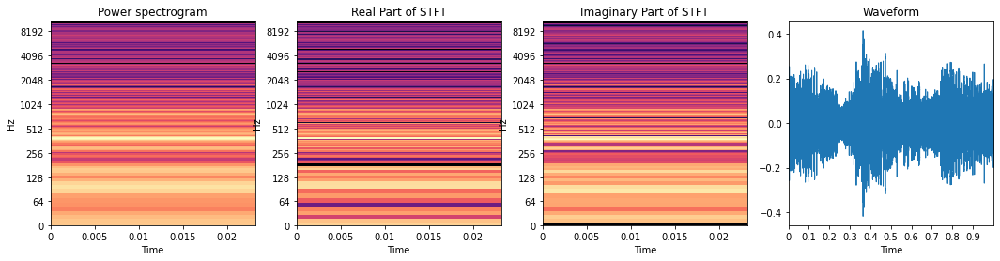

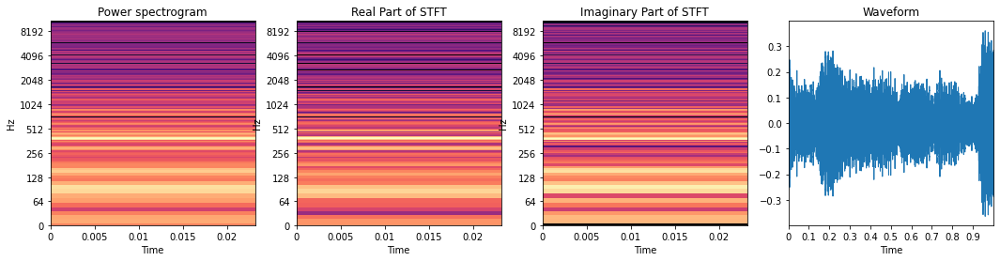

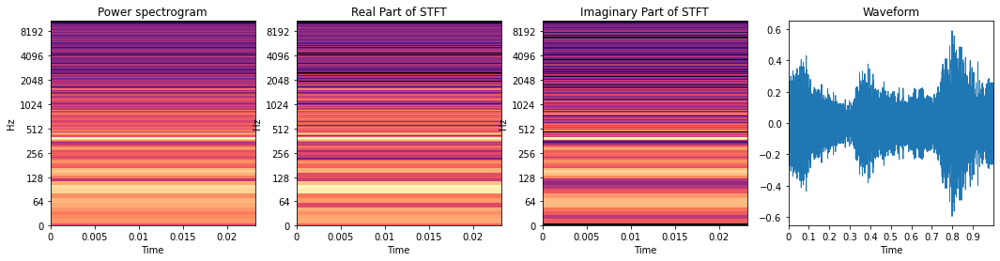

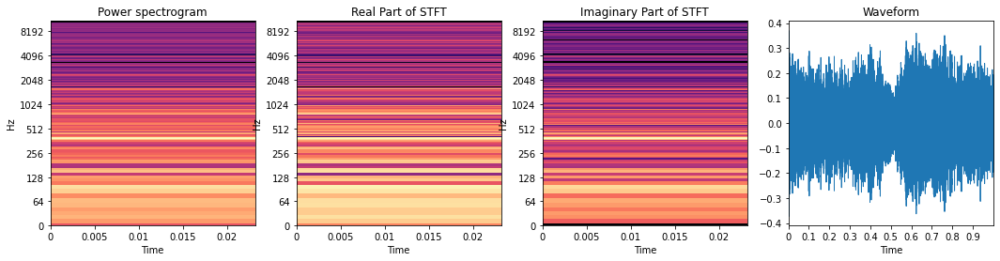

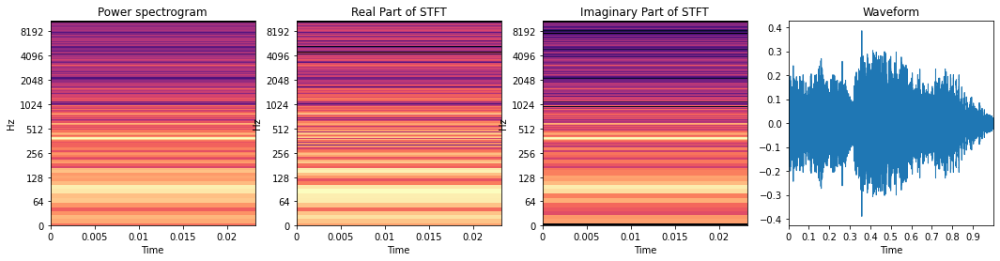

In [ ]:
n_fft = 2048
y1, sr = librosa.load(librosa.ex('brahms'))
y2, sr = librosa.load(librosa.ex('fishin'))
y = np.concatenate([y1, y2])
stft = librosa.stft(y, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
stft_plotter(stft, y, time=np.arange(5, 10))

# Model training
We split the data into training & validation set. Validation loss is used to reduce the learning rate if loss gets stuck.

 37%|███▋      | 28/75 [00:50<01:22,  1.76s/it, best_loss=0.0174, val_loss=0.0196]

Epoch    28: reducing learning rate of group 0 to 5.0000e-04.


 55%|█████▍    | 41/75 [01:13<00:57,  1.70s/it, best_loss=0.00224, val_loss=0.00727]

Epoch    41: reducing learning rate of group 0 to 2.5000e-04.


 72%|███████▏  | 54/75 [01:37<00:36,  1.73s/it, best_loss=0.000653, val_loss=0.00228]

Epoch    54: reducing learning rate of group 0 to 1.2500e-04.


 89%|████████▉ | 67/75 [02:00<00:14,  1.82s/it, best_loss=0.000224, val_loss=0.0006]

Epoch    67: reducing learning rate of group 0 to 6.2500e-05.


100%|██████████| 75/75 [02:14<00:00,  1.79s/it, best_loss=0.000142, val_loss=0.000246]

Fold 0 best validation loss:1.416e-04


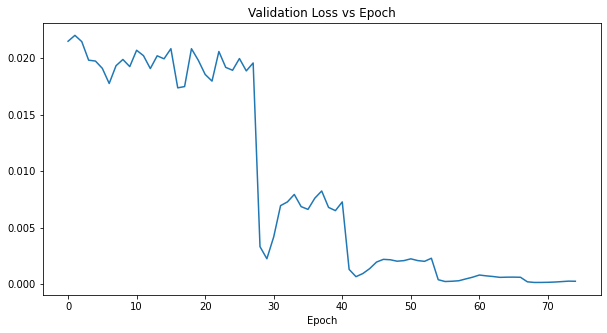

In [ ]:
batch_size, num_workers = 16, 4
num_epochs = 75
kf = KFold(n_splits=5, shuffle=True, random_state=1)
weight_dir = "./weights_stft"
os.makedirs(weight_dir, exist_ok=True)
device = 'cuda' if torch.cuda.is_available() else 'cpu'

inp_len = (n_fft//2 + 1)
for fold, (trn_idx, val_idx) in  enumerate(kf.split(np.arange(stft.shape[1]))):
    train_dataset = AudioDataSTFT(stft, y, trn_idx, val_idx, mode='train')
    val_dataset = AudioDataSTFT(stft, y, None, val_idx, mode='val')
    train_loader = DataLoader(train_dataset, batch_size=batch_size,
                        num_workers=num_workers, shuffle=True)

    val_loader = DataLoader(val_dataset, batch_size=batch_size,
                        num_workers=num_workers, shuffle=False)
    model = STFTModel(inp_len*2).to(device)
    all_val_loss = train_model_stft(model, train_loader, val_loader,
                                    weight_dir=weight_dir, device=device, lr=1e-3, fold=fold,
                                    num_epochs=num_epochs)
    best_loss = min(all_val_loss)
    print(f"Fold {fold} best validation loss:{best_loss:.3e}")
    plot_val_loss(all_val_loss)
    break # comment if you want to train 5 folds

## Performance on train set

In [ ]:
y, sr = librosa.load(librosa.ex('brahms'), duration=5, offset=10)
y = y[:np.power(2, int(np.log2(len(y))))-1]

stft = librosa.stft(y, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
full_dataset = AudioDataSTFT(stft, y, None, np.arange(stft.shape[1]), mode='val')
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
y_hat, full_loss = eval_model_stft(model, full_loader, device=device)
# assert len(y_hat)==len(y)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:3.397e-05


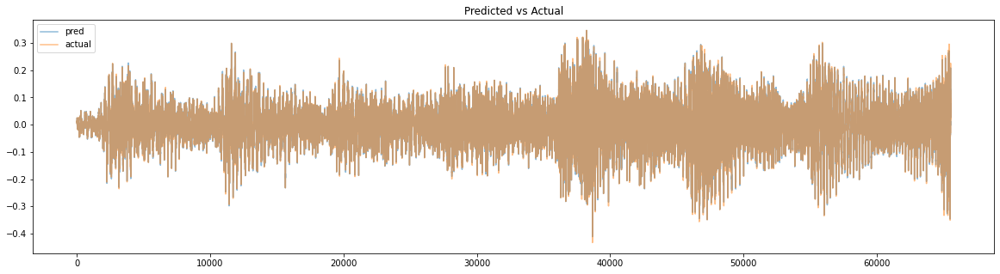

In [ ]:
compare_wave(y_hat, y)
Audio(y_hat, rate=sr)

In [ ]:
y, sr = librosa.load(librosa.ex('fishin'), duration=5, offset=10)
y = y[:np.power(2, int(np.log2(len(y))))-1]

stft = librosa.stft(y, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
full_dataset = AudioDataSTFT(stft, y, None, np.arange(stft.shape[1]), mode='val')
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
y_hat, full_loss = eval_model_stft(model, full_loader, device=device)
# assert len(y_hat)==len(y)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:1.157e-04


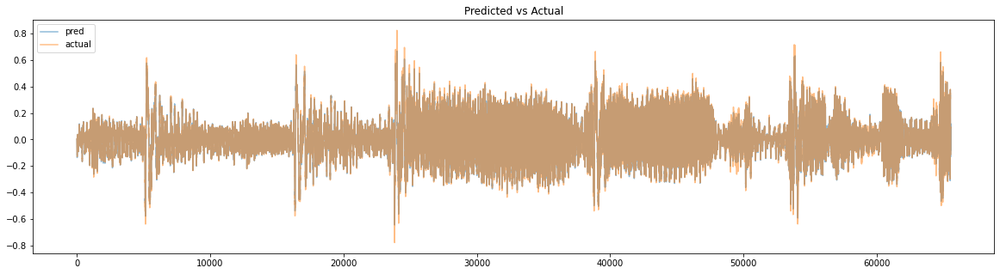

In [ ]:
compare_wave(y_hat, y)
Audio(y_hat, rate=sr)

## Performance on unseen test set

In [ ]:
test_audio, sr = librosa.load(librosa.ex('trumpet'))
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]
test_stft = librosa.stft(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )

In [ ]:
full_dataset = AudioDataSTFT(test_stft, test_audio, None, np.arange(test_stft.shape[1]), mode='val')
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
y_hat, full_loss = eval_model_stft(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:1.938e-04


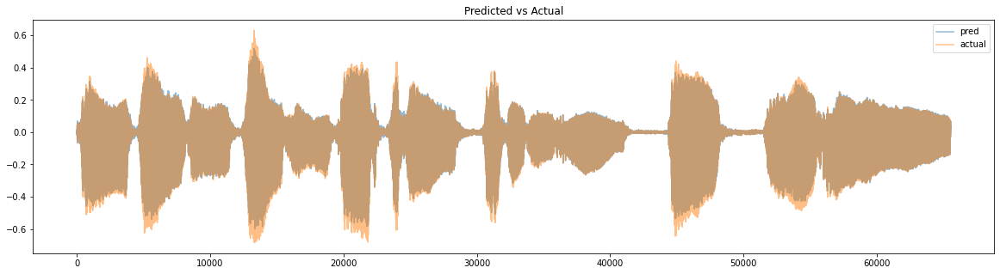

In [ ]:
compare_wave(y_hat, test_audio)
Audio(y_hat, rate=sr)

# Reassigned spectrogram

In [ ]:
y1, sr = librosa.load(librosa.ex('brahms'))
y2, sr = librosa.load(librosa.ex('fishin'))
y = np.concatenate([y1, y2])

y = y[:np.power(2, int(np.log2(len(y))))-1]
n_fft = 2048
freqs, times, mags  = librosa.reassigned_spectrogram(y, center=True, n_fft=n_fft, hop_length=n_fft//4,
                                                     win_length=n_fft,
                                                     fill_nan=False, pad_mode="wrap")
feat = preprocess_ra(freqs, times, mags)

## RA Features after preprocessing
Librosa outputs time in global frame. During the preprocessing step, we convert times from global to hop times.
All the features namely frequency, times and mags are normalized such that they are between 0 & 1

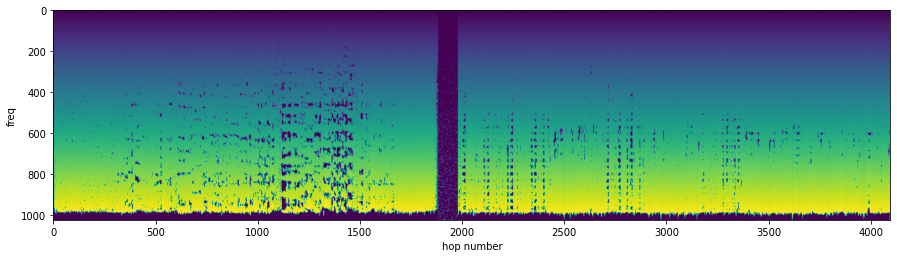

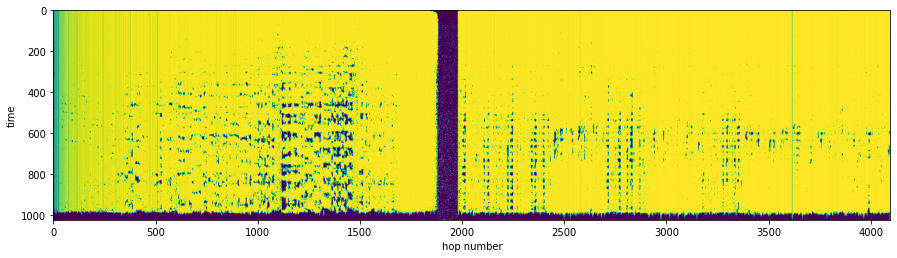

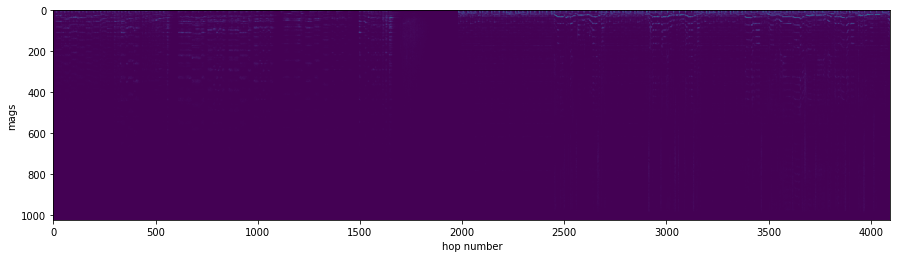

In [ ]:
ylabels = ['freq', 'time', 'mags']
for i, ylabel in zip(range(3), ylabels):
    plt.figure(figsize=(15, 15))
    plt.imshow(np.nan_to_num(feat[i*freqs.shape[0]:(i+1)*freqs.shape[0]]))
    plt.xlabel('hop number')
    plt.ylabel(ylabel)

  0%|          | 0/100 [00:00<?, ?it/s]/kaggle/usr/lib/train_utils/train_utils.py:158: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(orig_stft), np.array(all_pred_stft), y_hat, full_loss
100%|██████████| 100/100 [01:32<00:00,  1.08it/s, best_loss=0.0146, val_loss=0.0159]


Best validation loss:1.464e-02


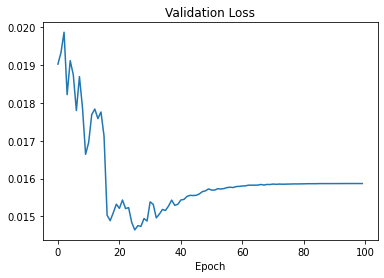

In [ ]:
batch_size, num_workers = 64, 4
num_epochs = 100
kf = KFold(n_splits=5, shuffle=True, random_state=1)
weight_dir = "./weights_ra"
os.makedirs(weight_dir, exist_ok=True)
device = 'cuda' if torch.cuda.is_available() else 'cpu'

stft = librosa.stft(y, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
inp_len = (n_fft//2 + 1)
for fold, (trn_idx, val_idx) in  enumerate(kf.split(np.arange(stft.shape[1]))):
    train_dataset = AudioData(stft, feat, y, trn_idx, val_idx, mode='train', cvt=False)
    val_dataset = AudioData(stft, feat, y, trn_idx, val_idx, mode='val', cvt=False)
    train_loader = DataLoader(train_dataset, batch_size=batch_size,
                        num_workers=num_workers, shuffle=True)

    val_loader = DataLoader(val_dataset, batch_size=batch_size,
                        num_workers=num_workers, shuffle=False)
    model = RAModel(feat.shape[0], neurons=2048).to(device)
    all_val_loss = train_model(model, train_loader, val_loader,
                               weight_dir=weight_dir, device=device, lr=1e-3,
                               num_epochs=num_epochs, fold=fold)
    best_loss = min(all_val_loss)
    print(f"Best validation loss:{best_loss:.3e}")
    plt.plot(all_val_loss)
    plt.title('Validation Loss')
    plt.xlabel('Epoch')
    break


## Performance on train set

In [ ]:
test_audio, sr = librosa.load(librosa.ex('brahms'), offset=10, duration=10)
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]  #round to nearest power of 2
freqs, times, test_mags  = librosa.reassigned_spectrogram(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft,
                                                          fill_nan=False)
feat = preprocess_ra(freqs, times, test_mags)
test_stft = librosa.stft(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
# dummy_stft = np.zeros_like(freqs, dtype=np.float32)
full_dataset = AudioData(test_stft, feat, test_audio, None, np.arange(test_stft.shape[1]), mode='val', cvt=False)
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
# model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_last.pth"))
orig_stft, all_pred_stft, y_hat, full_loss = eval_model(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:7.243e-03


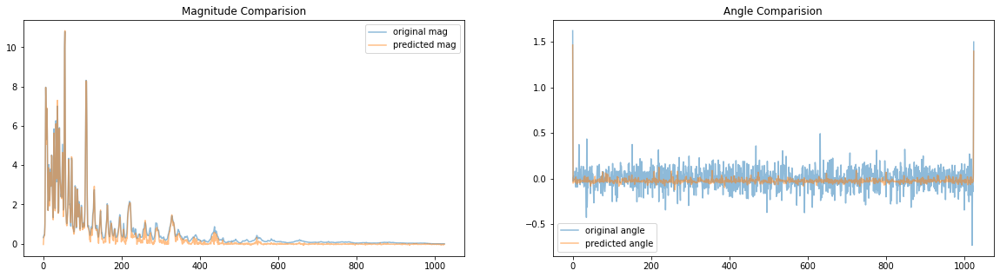

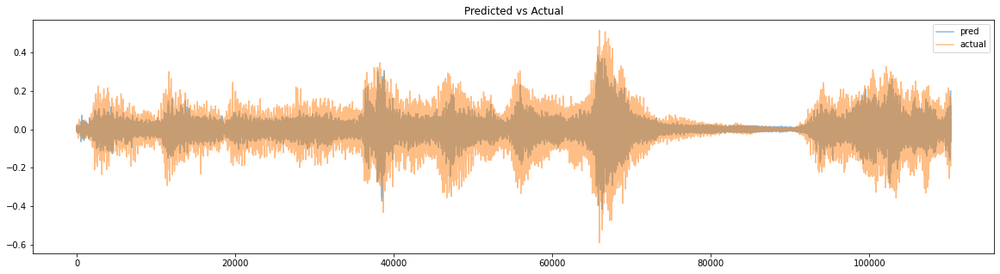

In [ ]:
compare_stft(orig_stft, all_pred_stft)
compare_wave(y_hat[:sr*5], test_audio[:sr*5])

In [ ]:
Audio(y_hat, rate=sr)

In [ ]:
test_audio, sr = librosa.load(librosa.ex('fishin'), offset=10, duration=10)
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]  #round to nearest power of 2
freqs, times, test_mags  = librosa.reassigned_spectrogram(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
feat = preprocess_ra(freqs, times, test_mags)
test_stft = librosa.stft(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
# dummy_stft = np.zeros_like(freqs, dtype=np.float32)
full_dataset = AudioData(test_stft, feat, test_audio, None, np.arange(test_stft.shape[1]), mode='val', cvt=False)
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_last.pth"))
# model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
orig_stft, all_pred_stft, y_hat, full_loss = eval_model(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:3.596e-02


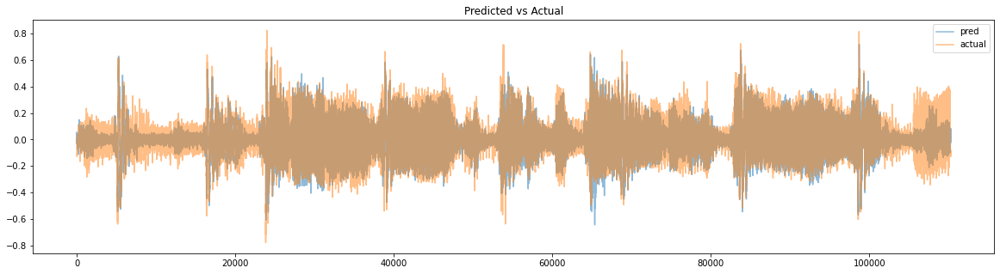

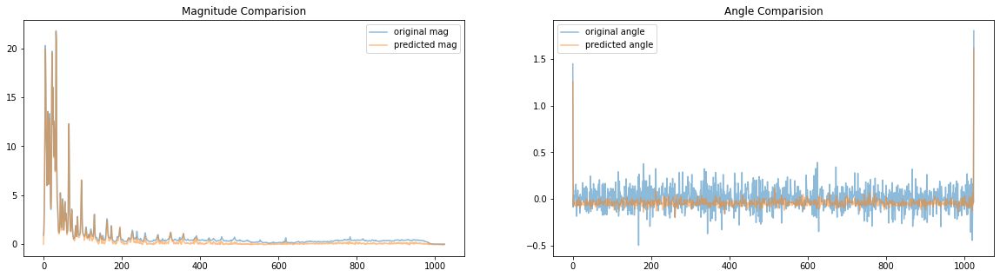

In [ ]:
compare_wave(y_hat[:sr*5], test_audio[:sr*5])
compare_stft(orig_stft, all_pred_stft)

In [ ]:
Audio(y_hat, rate=sr)

## Performance on test set

In [ ]:
test_audio, sr = librosa.load(librosa.ex('trumpet'))
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]  #round to nearest power of 2
freqs, times, test_mags  = librosa.reassigned_spectrogram(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
feat = preprocess_ra(freqs, times, test_mags)
test_stft = librosa.stft(test_audio, center=True, n_fft=n_fft, hop_length=n_fft//4, win_length=n_fft )
# dummy_stft = np.zeros_like(freqs, dtype=np.float32)
full_dataset = AudioData(test_stft, feat, test_audio, None, np.arange(test_stft.shape[1]), mode='val', cvt=False)
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
# model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_last.pth"))
orig_stft, all_pred_stft, y_hat, full_loss = eval_model(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:3.354e-02


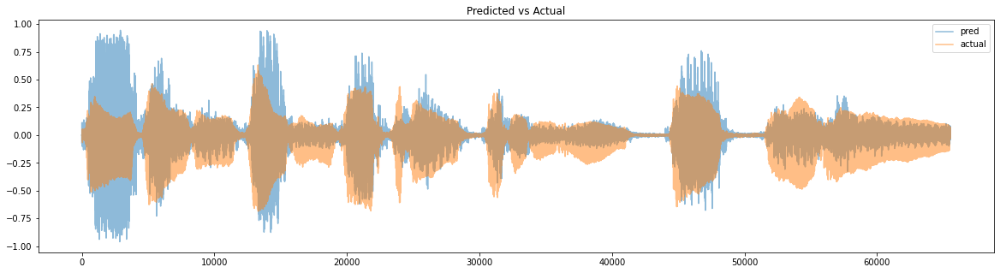

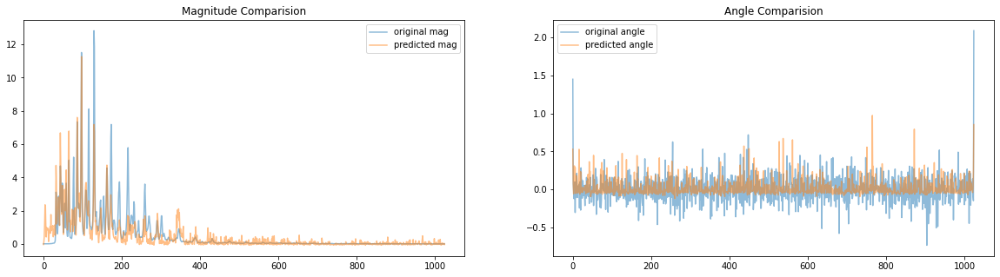

In [ ]:
compare_wave(y_hat[:sr*5], test_audio[:sr*5])
compare_stft(orig_stft, all_pred_stft)

In [ ]:
Audio(y_hat, rate=sr)

We used a very small training set in this notebook. I think with a larger training set, the model performance can be further improved.

# Kymatio

In [ ]:
!pip install -q kymatio
from kymatio.torch import Scattering1D as Scattering1DTorch
from kymatio.numpy import Scattering1D as Scattering1DNumpy

## Scattering transform
We use Kymatio's Scattering1D to obtain the frequency representation.

In [ ]:
# y, sr = librosa.load(librosa.ex('brahms'))
y1, sr = librosa.load(librosa.ex('brahms'))
y2, sr = librosa.load(librosa.ex('fishin'))
y = np.concatenate([y1, y2])
y = y[:np.power(2, int(np.log2(len(y))))-1]  #round to nearest power of 2
T = len(y)
J = 9  #2**9 = 512
Q = 10

scattering = Scattering1DNumpy(J, T, Q)
Sy = scattering(y).astype(np.float32)
# https://www.lostanlen.com/wp-content/uploads/2020/07/han2020fa.pdf
Sy = np.log1p(np.abs(Sy)/1e-3)*np.sign(Sy)

## Model training

  0%|          | 0/100 [00:00<?, ?it/s]/kaggle/usr/lib/train_utils/train_utils.py:158: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(orig_stft), np.array(all_pred_stft), y_hat, full_loss
100%|██████████| 100/100 [01:29<00:00,  1.11it/s, best_loss=0.0139, val_loss=0.0139]

Best validation loss:1.386e-02


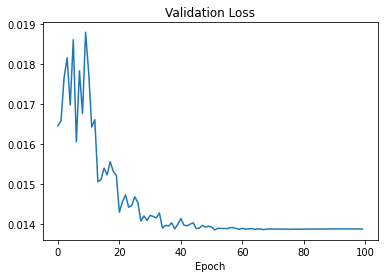

In [ ]:
batch_size, num_workers = 64, 4
num_epochs = 100
kf = KFold(n_splits=5, shuffle=True, random_state=1)
weight_dir = "./weights_kymatio"
os.makedirs(weight_dir, exist_ok=True)

stft = librosa.stft(y, center=True, n_fft=(2**J)*4, hop_length=(2**J), win_length=(2**J)*4)
for fold, (trn_idx, val_idx) in  enumerate(kf.split(np.arange(stft.shape[1]))):
    train_dataset = AudioData(stft, Sy, y, trn_idx, val_idx, mode='train', cvt=False)
    val_dataset = AudioData(stft, Sy, y, trn_idx, val_idx, mode='val', cvt=False)
    train_loader = DataLoader(train_dataset, batch_size=batch_size,
                        num_workers=num_workers, shuffle=True)

    val_loader = DataLoader(val_dataset, batch_size=batch_size,
                        num_workers=num_workers, shuffle=False)
    model = RAModel(Sy.shape[0]).to(device)
    all_val_loss = train_model(model, train_loader, val_loader,
                               weight_dir=weight_dir, device=device, lr=1e-3,
                               num_epochs=num_epochs, fold=fold)
    best_loss = min(all_val_loss)
    print(f"Best validation loss:{best_loss:.3e}")
    plt.plot(all_val_loss)
    plt.title('Validation Loss')
    plt.xlabel('Epoch')
    break

## Performance on train set

In [ ]:
test_audio, sr = librosa.load(librosa.ex('brahms'), duration=10, offset=10)
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]  #round to nearest power of 2
scattering = Scattering1DNumpy(J, len(test_audio), Q)
feat = scattering(test_audio).astype(np.float32)
feat = np.log1p(np.abs(feat)/1e-3)*np.sign(feat)

# dummy_stft = np.zeros_like(feat, dtype=np.float32)
test_stft = librosa.stft(test_audio, center=True, n_fft=(2**J)*4, hop_length=(2**J), win_length=(2**J)*4)
full_dataset = AudioData(test_stft, feat, test_audio, None, np.arange(test_stft.shape[1]), mode='val', cvt=False)
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                        drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_last.pth"))
orig_stft, all_pred_stft, y_hat, full_loss = eval_model(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:6.088e-03


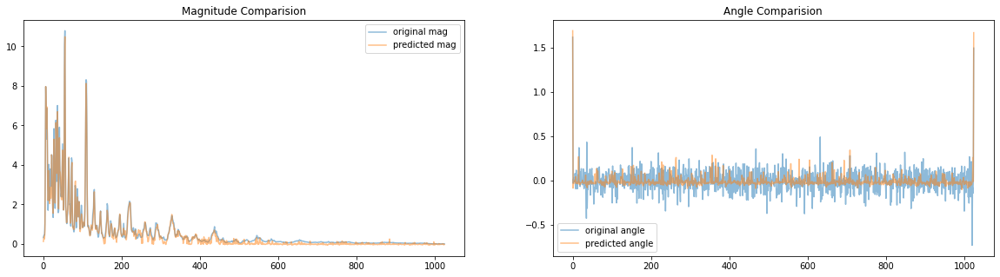

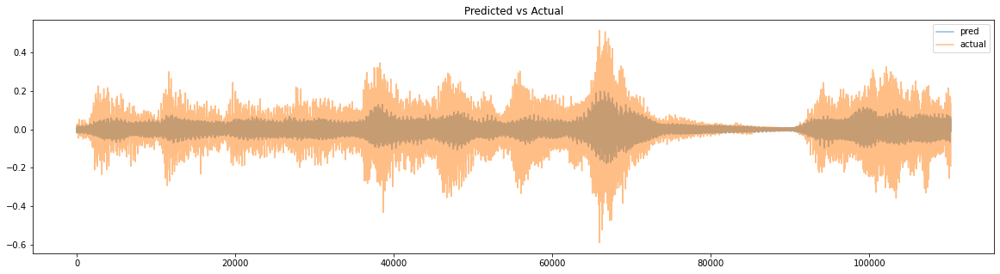

In [ ]:
compare_stft(orig_stft, all_pred_stft)
compare_wave(y_hat[:sr*5], test_audio[:sr*5])
Audio(y_hat, rate=sr)

In [ ]:
test_audio, sr = librosa.load(librosa.ex('fishin'), duration=10, offset=10)
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]  #round to nearest power of 2
scattering = Scattering1DNumpy(J, len(test_audio), Q)
feat = scattering(test_audio).astype(np.float32)
feat = np.log1p(np.abs(feat)/1e-3)*np.sign(feat)

# dummy_stft = np.zeros_like(feat, dtype=np.float32)
test_stft = librosa.stft(test_audio, center=True, n_fft=(2**J)*4, hop_length=(2**J), win_length=(2**J)*4)
full_dataset = AudioData(test_stft, feat, test_audio, None, np.arange(test_stft.shape[1]), mode='val', cvt=False)
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                         drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_last.pth"))
orig_stft, all_pred_stft, y_hat, full_loss = eval_model(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:2.703e-02


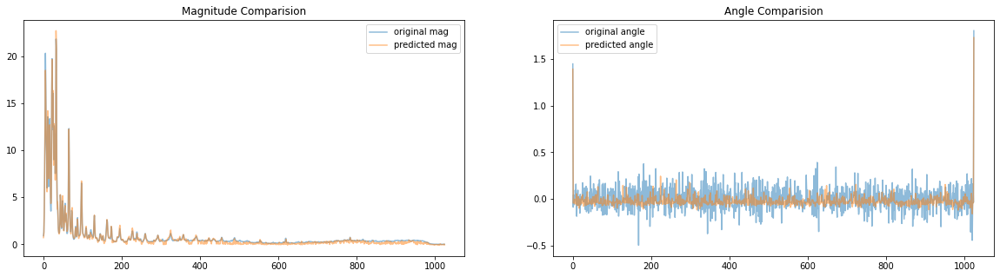

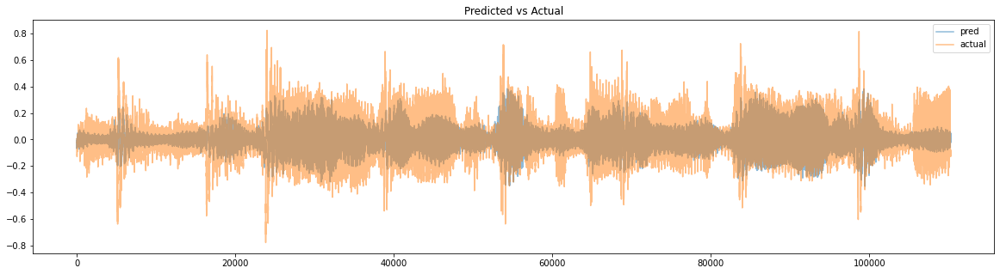

In [ ]:
compare_stft(orig_stft, all_pred_stft)
compare_wave(y_hat[:sr*5], test_audio[:sr*5])

In [ ]:
Audio(y_hat, rate=sr)

## Performance on test set

In [ ]:
test_audio, sr = librosa.load(librosa.ex('trumpet'), duration=5)
test_audio = test_audio[:np.power(2, int(np.log2(len(test_audio))))-1]  #round to nearest power of 2
scattering = Scattering1DNumpy(J, len(test_audio), Q)
feat = scattering(test_audio).astype(np.float32)
feat = np.log1p(np.abs(feat)/1e-3)*np.sign(feat)

# dummy_stft = np.zeros_like(feat, dtype=np.float32)
test_stft = librosa.stft(test_audio, center=True, n_fft=(2**J)*4, hop_length=(2**J), win_length=(2**J)*4)
full_dataset = AudioData(test_stft, feat, test_audio, None, np.arange(test_stft.shape[1]), mode='val', cvt=False)
full_loader = DataLoader(full_dataset, batch_size=batch_size,
                         num_workers=num_workers, shuffle=False,
                         drop_last=False)
model.load_state_dict(torch.load(f"./{weight_dir}/fold_{fold}_best.pth"))
orig_stft, all_pred_stft, y_hat, full_loss = eval_model(model, full_loader, device=device)
print(f'Loss on full dataset:{full_loss:.3e}')

Loss on full dataset:1.221e-02


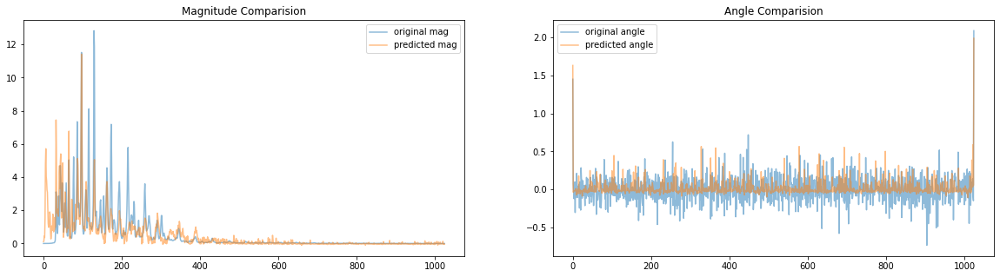

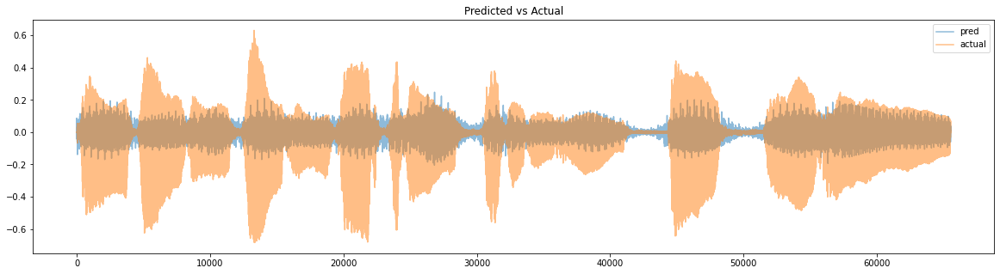

In [ ]:
compare_stft(orig_stft, all_pred_stft)
compare_wave(y_hat[:sr*5], test_audio[:sr*5])